In [ ]:
pip install -q tensorflow_decision_forests plotly wurlitzer

     |████████████████████████████████| 15.8 MB 10.1 MB/s 
     |████████████████████████████████| 511.7 MB 4.8 kB/s 
     |████████████████████████████████| 5.8 MB 82.6 MB/s 
     |████████████████████████████████| 1.6 MB 73.1 MB/s 
     |████████████████████████████████| 438 kB 85.6 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow_decision_forests as tfdf

import os
import numpy as np
import pandas as pd
import tensorflow as tf
import math

In [ ]:
print("Found TensorFlow Decision Forests v" + tfdf.__version__)

Found TensorFlow Decision Forests v0.2.6


In [ ]:
dataset_df  = pd.read_csv('/content/drive/MyDrive/minidata.csv')
label = "target"

classes = dataset_df[label].unique().tolist()
print(f"Label classes: {classes}")

dataset_df[label] = dataset_df[label].map(classes.index)

Label classes: [0, 1]


In [ ]:
# Split the dataset into a training and a testing dataset.

def split_dataset(dataset, test_ratio=0.30):
  """Splits a panda dataframe in two."""
  test_indices = np.random.rand(len(dataset)) < test_ratio
  return dataset[~test_indices], dataset[test_indices]


train_ds_pd, test_ds_pd = split_dataset(dataset_df)
print("{} examples in training, {} examples for testing.".format(
    len(train_ds_pd), len(test_ds_pd)))

20888 examples in training, 9112 examples for testing.


In [ ]:
train_ds = tfdf.keras.pd_dataframe_to_tf_dataset(train_ds_pd, label=label)
test_ds = tfdf.keras.pd_dataframe_to_tf_dataset(test_ds_pd, label=label)

/usr/local/lib/python3.7/dist-packages/tensorflow_decision_forests/keras/core.py:2542: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  features_dataframe = dataframe.drop(label, 1)


In [ ]:
# Specify the model.
model_1 = tfdf.keras.RandomForestModel()

# Train the model.
model_1.fit(x=train_ds)

Use /tmp/tmpxjwicmbd as temporary training directory
Reading training dataset...
Training dataset read in 0:00:07.851736. Found 20888 examples.
Training model...
Model trained in 0:00:13.475030
Compiling model...
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Model compiled.


### Evaluate the model

In [ ]:
model_1.compile(metrics=["accuracy"])
evaluation = model_1.evaluate(test_ds, return_dict=True)
print()

for name, value in evaluation.items():
  print(f"{name}: {value:.4f}")

10/10 [==============================] - 2s 97ms/step - loss: 0.0000e+00 - accuracy: 0.8855

loss: 0.0000
accuracy: 0.8855


In [ ]:
model_1.save("my_saved_model")

INFO:tensorflow:Assets written to: my_saved_model/assets


INFO:tensorflow:Assets written to: my_saved_model/assets


In [ ]:
tfdf.model_plotter.plot_model_in_colab(model_1, tree_idx=0, max_depth=3)

In [ ]:
model_1.summary()

Model: "random_forest_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
Total params: 1
Trainable params: 0
Non-trainable params: 1
_________________________________________________________________
Type: "RANDOM_FOREST"
Task: CLASSIFICATION
Label: "__LABEL"

Input Features (188):
	B_1
	B_10
	B_11
	B_12
	B_13
	B_14
	B_15
	B_16
	B_17
	B_18
	B_19
	B_2
	B_20
	B_21
	B_22
	B_23
	B_24
	B_25
	B_26
	B_27
	B_28
	B_29
	B_3
	B_30
	B_31
	B_32
	B_33
	B_36
	B_37
	B_38
	B_39
	B_4
	B_40
	B_41
	B_42
	B_5
	B_6
	B_7
	B_8
	B_9
	D_102
	D_103
	D_104
	D_105
	D_106
	D_107
	D_108
	D_109
	D_110
	D_111
	D_112
	D_113
	D_114
	D_115
	D_116
	D_117
	D_118
	D_119
	D_120
	D_121
	D_122
	D_123
	D_124
	D_125
	D_126
	D_127
	D_128
	D_129
	D_130
	D_131
	D_132
	D_133
	D_134
	D_135
	D_136
	D_137
	D_138
	D_139
	D_140
	D_141
	D_142
	D_143
	D_144
	D_145
	D_39
	D_41
	D_42
	D_43
	D_44
	D_45
	D_46
	D_47
	D_48
	D_49
	D_50
	D_51
	D_52
	D_53
	D_54
	

In [ ]:
# The input features
model_1.make_inspector().features()

["B_1" (1; #0),
 "B_10" (1; #1),
 "B_11" (1; #2),
 "B_12" (1; #3),
 "B_13" (1; #4),
 "B_14" (1; #5),
 "B_15" (1; #6),
 "B_16" (1; #7),
 "B_17" (1; #8),
 "B_18" (1; #9),
 "B_19" (1; #10),
 "B_2" (1; #11),
 "B_20" (1; #12),
 "B_21" (1; #13),
 "B_22" (1; #14),
 "B_23" (1; #15),
 "B_24" (1; #16),
 "B_25" (1; #17),
 "B_26" (1; #18),
 "B_27" (1; #19),
 "B_28" (1; #20),
 "B_29" (1; #21),
 "B_3" (1; #22),
 "B_30" (1; #23),
 "B_31" (1; #24),
 "B_32" (1; #25),
 "B_33" (1; #26),
 "B_36" (1; #27),
 "B_37" (1; #28),
 "B_38" (1; #29),
 "B_39" (1; #30),
 "B_4" (1; #31),
 "B_40" (1; #32),
 "B_41" (1; #33),
 "B_42" (1; #34),
 "B_5" (1; #35),
 "B_6" (1; #36),
 "B_7" (1; #37),
 "B_8" (1; #38),
 "B_9" (1; #39),
 "D_102" (1; #40),
 "D_103" (1; #41),
 "D_104" (1; #42),
 "D_105" (1; #43),
 "D_106" (1; #44),
 "D_107" (1; #45),
 "D_108" (1; #46),
 "D_109" (1; #47),
 "D_110" (1; #48),
 "D_111" (1; #49),
 "D_112" (1; #50),
 "D_113" (1; #51),
 "D_114" (1; #52),
 "D_115" (1; #53),
 "D_116" (1; #54),
 "D_117" (1; #

In [ ]:
# The feature importances
model_1.make_inspector().variable_importances()

{'MEAN_MIN_DEPTH': [("D_116" (1; #54), 11.479353051287315),
  ("D_66" (1; #109), 11.479353051287315),
  ("D_87" (1; #128), 11.479353051287315),
  ("__LABEL" (4; #188), 11.479353051287315),
  ("B_31" (1; #24), 11.479105432239695),
  ("D_126" (1; #64), 11.474845440011368),
  ("D_63" (1; #106), 11.46503284297952),
  ("D_111" (1; #49), 11.437287807556464),
  ("D_88" (1; #129), 11.434807243908397),
  ("D_68" (1; #110), 11.43022058040738),
  ("D_108" (1; #46), 11.427531254041801),
  ("D_117" (1; #55), 11.425438450843588),
  ("D_139" (1; #77), 11.419464897128677),
  ("D_82" (1; #124), 11.4190882637883),
  ("D_134" (1; #72), 11.418556485011257),
  ("D_110" (1; #48), 11.418358509296525),
  ("D_103" (1; #41), 11.418204142577695),
  ("D_136" (1; #74), 11.417620001586398),
  ("R_9" (1; #166), 11.417479714387483),
  ("D_137" (1; #75), 11.417418429034518),
  ("R_12" (1; #142), 11.417350196695411),
  ("D_73" (1; #115), 11.41598482292433),
  ("R_19" (1; #149), 11.415557154904446),
  ("R_25" (1; #156),

In [ ]:
model_1.make_inspector().evaluation()

Evaluation(num_examples=20888, accuracy=0.8853408655687476, loss=0.26646436844009935, rmse=None, ndcg=None, aucs=None, auuc=None, qini=None)

In [ ]:
model_1.make_inspector().training_logs()

[TrainLog(num_trees=1, evaluation=Evaluation(num_examples=7647, accuracy=0.8286909899306918, loss=6.174602271591711, rmse=None, ndcg=None, aucs=None, auuc=None, qini=None)),
 TrainLog(num_trees=11, evaluation=Evaluation(num_examples=20756, accuracy=0.8557525534785122, loss=1.586209742221346, rmse=None, ndcg=None, aucs=None, auuc=None, qini=None)),
 TrainLog(num_trees=21, evaluation=Evaluation(num_examples=20887, accuracy=0.8688658016948341, loss=0.7149933215394612, rmse=None, ndcg=None, aucs=None, auuc=None, qini=None)),
 TrainLog(num_trees=31, evaluation=Evaluation(num_examples=20888, accuracy=0.8748085024894676, loss=0.4713044319600038, rmse=None, ndcg=None, aucs=None, auuc=None, qini=None)),
 TrainLog(num_trees=41, evaluation=Evaluation(num_examples=20888, accuracy=0.8785905783224818, loss=0.39923124592993814, rmse=None, ndcg=None, aucs=None, auuc=None, qini=None)),
 TrainLog(num_trees=51, evaluation=Evaluation(num_examples=20888, accuracy=0.8805534278054385, loss=0.3552996426945954

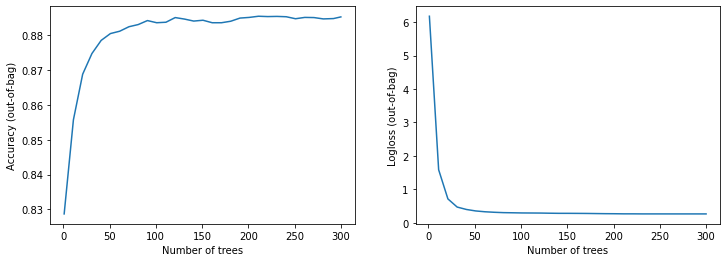

In [ ]:
import matplotlib.pyplot as plt

logs = model_1.make_inspector().training_logs()

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot([log.num_trees for log in logs], [log.evaluation.accuracy for log in logs])
plt.xlabel("Number of trees")
plt.ylabel("Accuracy (out-of-bag)")

plt.subplot(1, 2, 2)
plt.plot([log.num_trees for log in logs], [log.evaluation.loss for log in logs])
plt.xlabel("Number of trees")
plt.ylabel("Logloss (out-of-bag)")

plt.show()

In [ ]:
%load_ext tensorboard

In [ ]:
!rm -fr "/tmp/tensorboard_logs"
model_1.make_inspector().export_to_tensorboard("/tmp/tensorboard_logs")

In [ ]:
%tensorboard --logdir "/tmp/tensorboard_logs"

<IPython.core.display.Javascript object>

### Retraining the model

In [ ]:
tfdf.keras.get_all_models()

[tensorflow_decision_forests.keras.RandomForestModel,
 tensorflow_decision_forests.keras.GradientBoostedTreesModel,
 tensorflow_decision_forests.keras.CartModel,
 tensorflow_decision_forests.keras.DistributedGradientBoostedTreesModel]

In [ ]:
feature_1 = tfdf.keras.FeatureUsage(name="D_104")
feature_2 = tfdf.keras.FeatureUsage(name="D_134")

all_features = [feature_1, feature_2]

# Note: This model is only trained with two features. It will not be as good as
# the one trained on all features.

model_2 = tfdf.keras.GradientBoostedTreesModel(
    features=all_features, exclude_non_specified_features=True)

model_2.compile(metrics=["accuracy"])
model_2.fit(x=train_ds, validation_data=test_ds)

print(model_2.evaluate(test_ds, return_dict=True))

Use /tmp/tmpvf13aigm as temporary training directory
Reading training dataset...
Training dataset read in 0:00:02.392087. Found 20888 examples.
Reading validation dataset...
Num validation examples: tf.Tensor(9112, shape=(), dtype=int32)
Validation dataset read in 0:00:01.291495. Found 9112 examples.
Training model...
Model trained in 0:00:00.783988
Compiling model...
Model compiled.
10/10 [==============================] - 1s 91ms/step - loss: 0.0000e+00 - accuracy: 0.7439
{'loss': 0.0, 'accuracy': 0.743854284286499}


In [ ]:
model_6 = tfdf.keras.GradientBoostedTreesModel(
    num_trees=500, growing_strategy="BEST_FIRST_GLOBAL", max_depth=8)
model_6.fit(x=train_ds)

Use /tmp/tmpinxswibr as temporary training directory
Reading training dataset...
Training dataset read in 0:00:04.032674. Found 20888 examples.
Training model...
Model trained in 0:00:41.531788
Compiling model...
Model compiled.


In [ ]:
model_7 = tfdf.keras.GradientBoostedTreesModel(
    num_trees=500,
    growing_strategy="BEST_FIRST_GLOBAL",
    max_depth=8,
    split_axis="SPARSE_OBLIQUE",
    categorical_algorithm="RANDOM",
    )
model_7.fit(x=train_ds)

Use /tmp/tmp703xfbe9 as temporary training directory
Reading training dataset...
Training dataset read in 0:00:04.016255. Found 20888 examples.
Training model...
Model trained in 0:21:17.486274
Compiling model...
Model compiled.


In [ ]:
# A good template of hyper-parameters.
model_8 = tfdf.keras.GradientBoostedTreesModel(hyperparameter_template="benchmark_rank1")
model_8.fit(x=train_ds)

Resolve hyper-parameter template "benchmark_rank1" to "benchmark_rank1@v1" -> {'growing_strategy': 'BEST_FIRST_GLOBAL', 'categorical_algorithm': 'RANDOM', 'split_axis': 'SPARSE_OBLIQUE', 'sparse_oblique_normalization': 'MIN_MAX', 'sparse_oblique_num_projections_exponent': 1.0}.
Use /tmp/tmpbdbfm_hs as temporary training directory
Reading training dataset...


Training dataset read in 0:00:03.920243. Found 20888 examples.
Training model...
Model trained in 0:00:40.736176
Compiling model...


Model compiled.


In [ ]:
# The hyper-parameter templates of the Gradient Boosted Tree model.
print(tfdf.keras.GradientBoostedTreesModel.predefined_hyperparameters())

[HyperParameterTemplate(name='better_default', version=1, parameters={'growing_strategy': 'BEST_FIRST_GLOBAL'}, description='A configuration that is generally better than the default parameters without being more expensive.'), HyperParameterTemplate(name='benchmark_rank1', version=1, parameters={'growing_strategy': 'BEST_FIRST_GLOBAL', 'categorical_algorithm': 'RANDOM', 'split_axis': 'SPARSE_OBLIQUE', 'sparse_oblique_normalization': 'MIN_MAX', 'sparse_oblique_num_projections_exponent': 1.0}, description='Top ranking hyper-parameters on our benchmark slightly modified to run in reasonable time.')]


In [ ]:
body_mass_g = tf.keras.layers.Input(shape=(1,), name="D_104")
body_mass_kg = body_mass_g / 1000.0

bill_length_mm = tf.keras.layers.Input(shape=(1,), name="D_134")

raw_inputs = {"D_104": body_mass_g, "D_134": bill_length_mm}
processed_inputs = {"body_mass_kg": body_mass_kg, "D_134": bill_length_mm}

# "preprocessor" contains the preprocessing logic.
preprocessor = tf.keras.Model(inputs=raw_inputs, outputs=processed_inputs)

# "model_4" contains both the pre-processing logic and the decision forest.
model_4 = tfdf.keras.RandomForestModel(preprocessing=preprocessor)
model_4.fit(x=train_ds)

model_4.summary()

Use /tmp/tmp_clf94pw as temporary training directory
Reading training dataset...


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:566: UserWarning: Input dict contained keys ['P_2', 'D_39', 'B_1', 'B_2', 'R_1', 'S_3', 'D_41', 'B_3', 'D_42', 'D_43', 'D_44', 'B_4', 'D_45', 'B_5', 'R_2', 'D_46', 'D_47', 'D_48', 'D_49', 'B_6', 'B_7', 'B_8', 'D_50', 'D_51', 'B_9', 'R_3', 'D_52', 'P_3', 'B_10', 'D_53', 'S_5', 'B_11', 'S_6', 'D_54', 'R_4', 'S_7', 'B_12', 'S_8', 'D_55', 'D_56', 'B_13', 'R_5', 'D_58', 'S_9', 'B_14', 'D_59', 'D_60', 'D_61', 'B_15', 'S_11', 'D_62', 'D_63', 'D_64', 'D_65', 'B_16', 'B_17', 'B_18', 'B_19', 'D_66', 'B_20', 'D_68', 'S_12', 'R_6', 'S_13', 'B_21', 'D_69', 'B_22', 'D_70', 'D_71', 'D_72', 'S_15', 'B_23', 'D_73', 'P_4', 'D_74', 'D_75', 'D_76', 'B_24', 'R_7', 'D_77', 'B_25', 'B_26', 'D_78', 'D_79', 'R_8', 'R_9', 'S_16', 'D_80', 'R_10', 'R_11', 'B_27', 'D_81', 'D_82', 'S_17', 'R_12', 'B_28', 'R_13', 'D_83', 'R_14', 'R_15', 'D_84', 'R_16', 'B_29', 'B_30', 'S_18', 'D_86', 'D_87', 'R_17', 'R_18', 'D_88', 'B_31', 'S_19', 'R_19', 'B_32', 'S_2

Training dataset read in 0:00:02.594788. Found 20888 examples.
Training model...
Model trained in 0:00:03.099123
Compiling model...


Model compiled.


Model: "random_forest_model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_1 (Functional)        {'body_mass_kg': (None,   0         
                             1),                                 
                              'D_134': (None, 1)}                
                                                                 
Total params: 1
Trainable params: 0
Non-trainable params: 1
_________________________________________________________________
Type: "RANDOM_FOREST"
Task: CLASSIFICATION
Label: "__LABEL"

Input Features (2):
	D_134
	body_mass_kg

No weights

Variable Importance: MEAN_MIN_DEPTH:
    1.      "__LABEL" 12.509431 ################
    2.        "D_134"  1.953603 ##
    3. "body_mass_kg"  0.000000 

Variable Importance: NUM_AS_ROOT:
    1. "body_mass_kg" 300.000000 

Variable Importance: NUM_NODES:
    1.        "D_134" 114104.000000 ################
    2. "body_mass_kg" 1

### Proximities

In [ ]:
import tensorflow_decision_forests as tfdf

import matplotlib.colors as mcolors
import math
import os
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from plotly.offline import iplot
import plotly.graph_objs as go

In [ ]:
model = tfdf.keras.RandomForestModel(num_trees=1000)
model.fit(train_ds)

Use /tmp/tmps0n02fff as temporary training directory
Reading training dataset...
Training dataset read in 0:00:03.872826. Found 20888 examples.
Training model...
Model trained in 0:00:40.772414
Compiling model...
Model compiled.


In [ ]:
model_inspector = model.make_inspector()
out_of_bag_accuracy = model_inspector.evaluation().accuracy
print(f"Out-of-bag accuracy: {out_of_bag_accuracy:.4f}")

Out-of-bag accuracy: 0.8855


In [ ]:
model.compile(["accuracy"])
test_accuracy = model.evaluate(test_ds, return_dict=True, verbose=0)["accuracy"]
print(f"Test accuracy: {test_accuracy:.4f}")

Test accuracy: 0.8826


In [ ]:
print("The model contains", model_inspector.num_trees(), "trees.")
print("The test dataset contains", test_ds_pd.shape[0], "examples.")

The model contains 1000 trees.
The test dataset contains 9112 examples.


In [ ]:
leaves = model.predict_get_leaves(test_ds)
print("The leaf indices:\n", leaves)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
The leaf indices:
 [[140  39 154 ...   3 149 238]
 [ 30 233 125 ...  27 604 204]
 [ 13 157 152 ... 193 617  99]
 ...
 [483 486 434 ... 444  77 407]
 [193 213 442 ... 386 375 163]
 [ 93  51 170 ... 681 684 249]]


In [ ]:
print("The predicted leaves have shape", leaves.shape,
      "(we expect [num_examples, num_trees]")

The predicted leaves have shape (9112, 1000) (we expect [num_examples, num_trees]


In [ ]:
def compute_proximity(leaves, step_size=100):

  example_idx = 0
  num_examples = leaves.shape[0]
  t_leaves = np.transpose(leaves)
  proximities = []

  # Instead of computing the proximity in between all the examples at the same
  # time, we compute the similarity in blocks of "step_size" examples. This
  # makes the code more efficient with the the numpy broadcast.
  while example_idx < num_examples:
    end_idx = min(example_idx + step_size, num_examples)
    proximities.append(
        np.mean(
            leaves[..., np.newaxis] == t_leaves[:,
                                                example_idx:end_idx][np.newaxis,
                                                                     ...],
            axis=1))
    example_idx = end_idx
  return np.concatenate(proximities, axis=1)


proximity = compute_proximity(leaves)
print("The shape of proximity is", proximity.shape)

The shape of proximity is (9112, 9112)


In [ ]:
proximity

array([[1.   , 0.052, 0.013, ..., 0.   , 0.   , 0.026],
       [0.052, 1.   , 0.069, ..., 0.   , 0.004, 0.09 ],
       [0.013, 0.069, 1.   , ..., 0.   , 0.016, 0.014],
       ...,
       [0.   , 0.   , 0.   , ..., 1.   , 0.007, 0.   ],
       [0.   , 0.004, 0.016, ..., 0.007, 1.   , 0.   ],
       [0.026, 0.09 , 0.014, ..., 0.   , 0.   , 1.   ]])

In [ ]:
distance = 1 - proximity

t_sne = TSNE(
    # Number of dimensions to display. 3d is also possible.
    n_components=2,
    # Control the shape of the projection. Higher values create more
    # distinct but also more collapsed clusters. Can be in 5-50.
    perplexity=20,
    metric="precomputed",
    init="random",
    verbose=1,
    square_distances=True,
    learning_rate="auto").fit_transform(distance)

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9112 samples in 0.171s...
[t-SNE] Computed neighbors for 9112 samples in 1.244s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9112
[t-SNE] Computed conditional probabilities for sample 2000 / 9112
[t-SNE] Computed conditional probabilities for sample 3000 / 9112
[t-SNE] Computed conditional probabilities for sample 4000 / 9112
[t-SNE] Computed conditional probabilities for sample 5000 / 9112
[t-SNE] Computed conditional probabilities for sample 6000 / 9112
[t-SNE] Computed conditional probabilities for sample 7000 / 9112
[t-SNE] Computed conditional probabilities for sample 8000 / 9112
[t-SNE] Computed conditional probabilities for sample 9000 / 9112
[t-SNE] Computed conditional probabilities for sample 9112 / 9112
[t-SNE] Mean sigma: 0.145321
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.949028
[t-SNE] KL divergence after 1000 iterations: 2.130479


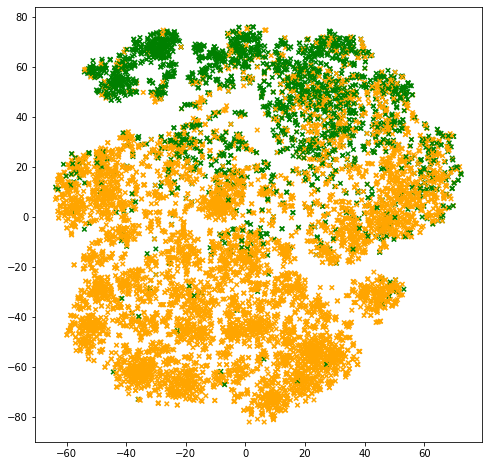

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.grid(False)

# Color the points according to the label value.
colors = (test_ds_pd['target'] == 1).map(lambda x: ["orange", "green"][x])
ax.scatter(
    t_sne[:, 0], t_sne[:, 1], c=colors, linewidths=0.5, marker="x", s=20)

In [ ]:
def interactive_plot(dataset, projections):

  def label_fn(row):
    """HTML printer over each example."""
    return "<br>".join([f"<b>{k}:</b> {v}" for k, v in row.items()])

  labels = list(dataset.apply(label_fn, axis=1).values)
  iplot({
      "data": [
          go.Scatter(
              x=projections[:, 0],
              y=projections[:, 1],
              text=labels,
              mode="markers",
              marker={
                  "color": colors,
                  "size": 3,
              })
      ],
      "layout": go.Layout(width=600, height=600, template="simple_white")
  })


interactive_plot(test_ds_pd, t_sne)

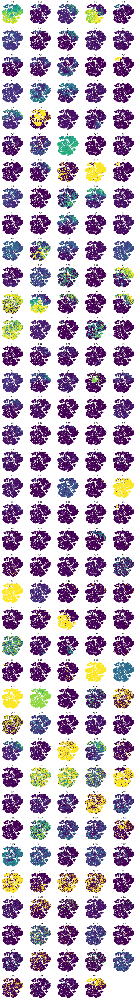

In [ ]:
# Number of columns and rows in the multi-plot.
num_plot_cols = 5
num_plot_rows = math.ceil(test_ds_pd.shape[1] / num_plot_cols)

# Color palette for the categorical features.
palette = list(mcolors.TABLEAU_COLORS.values())

# Create the plot
plot_size_in = 3.5
fig, axs = plt.subplots(
    num_plot_rows,
    num_plot_cols,
    figsize=(num_plot_cols * plot_size_in, num_plot_rows * plot_size_in))

# Hide the borders.
for row in axs:
  for ax in row:
    ax.set_axis_off()

for col_idx, col_name in enumerate(test_ds_pd):
  ax = axs[col_idx // num_plot_cols, col_idx % num_plot_cols]

  colors = test_ds_pd[col_name]
  if colors.dtypes in [str, object]:
    # Use the color palette on categorical features.
    unique_values = list(colors.unique())
    colors = colors.map(
        lambda x: palette[unique_values.index(x) % len(palette)])

  ax.set_title(col_name)
  ax.scatter(t_sne[:, 0], t_sne[:, 1], c=colors.values, linewidths=0.5,
      marker="x", s=5)

In [ ]:
def select_example(labels, distance_matrix, k):
  """Selects the example with the highest number of neighbors with the same class.

  Usage example:
    n = 5
    select_example(
        np.random.randint(0,2, size=n),
        np.random.uniform(size=(n,n)),
        2)

  Returns:
    The list of neighbors for the selected example. Includes the selected
    example.
  """

  partition = np.argpartition(distance_matrix, k)[:,:k]
  same_label = np.mean(np.equal(labels[partition], np.expand_dims(labels, axis=1)), axis=1)
  selected_example = np.argmax(same_label)
  return partition[selected_example, :]

In [ ]:
def extract_prototype_examples(labels, distance_matrix, k, num_prototypes):
  """Extracts a list of examples in each prototype.

  Usage example:
    n = 50
    print(extract_prototype_examples(
        labels=np.random.randint(0, 2, size=n),
        distance_matrix=np.random.uniform(size=(n, n)),
        k=2,
        num_prototypes=3))

  Returns:
    An array where E[i][j] is the index of the j-th examples of the i-th
    prototype. 
  """

  example_idxs = np.arange(len(labels))
  prototypes = []
  examples_per_prototype = []

  for iter in range(num_prototypes):
    print(f"Iter #{iter}")
    # Select the example
    neighbors = select_example(labels, distance_matrix, k)

    # Index of the examples in the prototype
    examples_per_prototype.append(list(example_idxs[neighbors]))

    # Remove the selected examples
    example_idxs = np.delete(example_idxs, neighbors)
    labels = np.delete(labels, neighbors)
    distance_matrix = np.delete(distance_matrix, neighbors, axis=0)
    distance_matrix = np.delete(distance_matrix, neighbors, axis=1)

  return examples_per_prototype

In [ ]:
examples_per_prototype = extract_prototype_examples(test_ds_pd["target"].values, distance, k=20, num_prototypes=10)
print(f"Found examples for {len(examples_per_prototype)} prototypes.")

Iter #0
Iter #1
Iter #2
Iter #3
Iter #4
Iter #5
Iter #6
Iter #7
Iter #8
Iter #9
Found examples for 10 prototypes.


In [ ]:
def build_prototype(dataset):
  
  prototype = {}
  for col in dataset.columns:
    col_values = dataset[col]
    if col_values.dtypes in [str, object]:
      # A categorical feature.

      # Remove the missing values
      col_values = [x for x in col_values if isinstance(x,str) or not math.isnan(x)]

      # Frequency of each possible value.
      frequency_item, frequency_count = np.unique(col_values, return_counts=True)
      top_item_idx = np.argmax(frequency_count)
      top_item_probability = frequency_count[top_item_idx] / np.sum(frequency_count)

      # Print the most common item.
      prototype[col] = f"{frequency_item[top_item_idx]} ({100*top_item_probability:.0f}%)"

    else:
      # A numerical feature.
      quartiles = np.nanquantile(col_values.values, [0.25, 0.5, 0.75])
      # Print the 3 quantiles.
      prototype[col] = f"{quartiles[0]} {quartiles[1]} {quartiles[2]}"
  return prototype

In [ ]:
prototypes = []
for examples in examples_per_prototype:
  # Prorotype statistics.
  prototypes.append(build_prototype(test_ds_pd.iloc[examples, :]))
prototypes = pd.DataFrame(prototypes)

prototypes

,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,0.78325 0.84765 0.86935,0.0034000000000000002 0.004855 0.0084587500000...,0.0025445 0.00366 0.00808875,0.81505 0.8182 0.819075,0.00168325 0.004432500000000001 0.0075595,0.0846675 0.139 0.162525,0.0022385 0.0042475 0.005554750000000001,0.0034365000000000003 0.006448000000000001 0.0...,0.0230575 0.048659999999999995 0.1337125,0.03339 0.043469999999999995 0.09885,...,0.00244275 0.00427 0.0071125,0.0033037500000000003 0.0072015 0.009165,0.0024704999999999996 0.0041919999999999995 0....,0.0017525000000000002 0.00456 0.00681,0.00149875 0.0037775 0.006119,0.2999 0.4923 0.5471,0.0009270999999999999 0.0022305 0.004732500000...,0.00329125 0.005542 0.0065112500000000005,0.003957250000000001 0.0064410000000000005 0.0...,0.0 0.0 0.0
1,0.5463 0.6508499999999999 0.770175,0.00816325 0.17925 0.35919999999999996,0.024515000000000002 0.03483 0.044035000000000005,1.0 1.0045 1.00625,0.003935 0.0053405 0.0074884999999999995,0.109985 0.14425 0.16405,0.0042385 0.0054800000000000005 0.007586249999...,0.00391125 0.006405 0.0089925,0.037865 0.12475 0.38380000000000003,0.038385 0.05902 0.06952249999999999,...,0.00195475 0.0046385 0.00605425,0.0033945 0.0061025 0.13227499999999998,0.00292675 0.00662 0.008494999999999999,0.004344 0.00642 0.00814875,0.0035202500000000004 0.006214 0.0085875000000...,0.28515 0.4434 0.59315,0.002048 0.00606 0.00885,0.00202775 0.004921 0.00702275,0.004160499999999999 0.007979 0.009425,0.0 0.0 0.0
2,0.218725 0.3115 0.37235,0.916 0.9192 1.06475,0.232775 0.34865 0.52325,0.0046022500000000004 0.008426 0.0144525,0.5021749999999999 0.50665 0.5093,0.2013 0.3152 0.593875,0.476875 0.6536 0.9580500000000001,0.243175 0.4607 0.7567,0.066975 0.1341 0.21445,0.106845 0.15715 0.28575,...,0.003107 0.0043715 0.0071024999999999994,0.00256925 0.00648 0.50315,0.002311 0.0062905 0.008625,0.00290275 0.005948 0.00805,0.00198275 0.0028715 0.0085375,0.2115 0.3644 0.5521750000000001,0.002095 0.0050065000000000005 0.00931,0.00138325 0.0032329999999999998 0.007736,0.003938 0.0067195 0.00885375,1.0 1.0 1.0
3,0.71375 0.7976000000000001 0.887575,0.0030262500000000003 0.004515 0.0066545,0.002176 0.003886 0.006148750000000001,0.813375 0.8162 0.8184,0.00335975 0.0067995 0.008968499999999999,0.159975 0.29445 0.443875,0.0030529999999999997 0.0043230000000000005 0....,0.0041915 0.006207000000000001 0.0075475,0.063695 0.16475 0.28905000000000003,0.03908 0.07431 0.12190000000000001,...,0.0038634999999999997 0.005495 0.00827375,0.00412925 0.006402 0.008626249999999999,0.00359825 0.0060885 0.0084825,0.00336425 0.0050504999999999994 0.00665674999...,0.001612 0.00712 0.009055,0.24464999999999998 0.45815 0.6028749999999999,0.00426225 0.0070325 0.008039999999999999,0.00314775 0.00601 0.0091515,0.00443425 0.007046 0.008517499999999999,0.0 0.0 0.0
4,0.869 0.9461999999999999 0.98,0.0055895 0.021519999999999997 0.1669500000000...,0.00959625 0.019525 0.025772499999999997,1.001 1.004 1.00625,0.003118 0.0054815 0.0072335,0.0763475 0.09848000000000001 0.12013750000000001,0.0019377500000000002 0.0047515000000000005 0....,0.00717425 0.009389999999999999 0.010935,0.0117125 0.07513500000000001 0.23320000000000002,0.0278975 0.0492 0.090025,...,0.0024105 0.005716 0.008389,0.004365 0.0082425 0.506075,0.003657 0.0061985 0.00895875,0.004091249999999999 0.0054210000000000005 0.0...,0.0025777499999999997 0.00587 0.008785,0.2851 0.47650000000000003 0.6054999999999999,0.003322 0.00472 0.00782,0.00399 0.0063820000000000005 0.009379,0.005155750000000001 0.008197 0.0092925,0.0 0.0 0.0
5,0.8886999999999999 0.9314 0.98755,0.002574 0.004285000000000001 0.0134865,0.00662125 0.0090575 0.0123425,0.8154 1.001 1.008,0.0027735 0.0059935000000000006 0.00661575,0.25935 0.29795 0.348275,0.0031657499999999997 0.0045795 0.0065925,0.0047215 0.0056035 0.008713750000000001,0.1186125 0.21095 0.37775000000000003,0.008224 0.0401 0.10247500000000001,...,0.001665 0.0039565 0.00571425,0.0050290000000000005 0.

In [ ]:
prototypes_projection = []
for examples in examples_per_prototype:
  # t-SNE for each prototype.
  prototypes_projection.append(np.mean(t_sne[examples,:],axis=0))
prototypes_projection = np.stack(prototypes_projection)

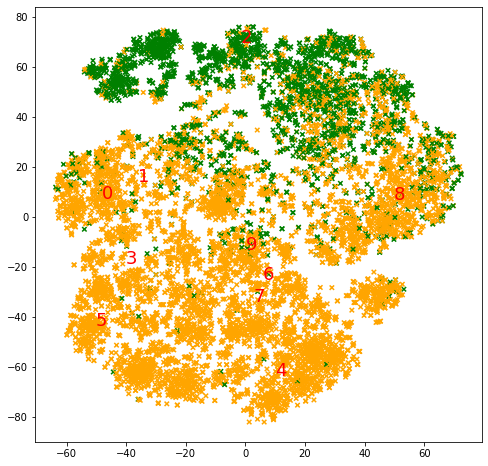

In [ ]:
# Plot the mean 2d t-SNE projection of the elements in the prototypes.

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.grid(False)

# Color the points according to the label value.
colors = (test_ds_pd["target"] == 1).map(lambda x: ["orange", "green"][x])
ax.scatter(
    t_sne[:, 0], t_sne[:, 1], c=colors, linewidths=0.5, marker="x", s=20)

# Add the prototype indices.
for i in range(prototypes_projection.shape[0]):
  ax.text(prototypes_projection[i, 0],
          prototypes_projection[i, 1],
          f"{i}",
          fontdict={"size":18},
          c="red")

In [ ]:
example_idx = 0
k = 20
neighbors = np.argpartition(distance[example_idx, :], k)[:k]

print(f"The example #{example_idx} is:")
print("===============================")
print(test_ds_pd.iloc[example_idx, :])
print("")
print(f"The prototype around the example #{example_idx} is:")
print("============================================")
print(pd.Series(build_prototype(test_ds_pd.iloc[neighbors, :])))

The example #0 is:
P_2       0.672000
D_39      0.184000
B_1       0.029130
B_2       1.007000
R_1       0.000747
            ...   
D_142     0.329600
D_143     1.003000
D_144     1.191000
D_145     0.186600
target    0.000000
Name: 2, Length: 189, dtype: float64

The prototype around the example #0 is:
P_2          0.686625 0.7204999999999999 0.8123750000000001
D_39               0.0032375 0.008154999999999999 0.0095725
B_1                            0.00364175 0.009795 0.028755
B_2                         0.8145 1.0019999999999998 1.006
R_1       0.0012496249999999999 0.003978000000000001 0.0...
                                ...                        
D_142                               0.270375 0.41855 0.5629
D_143                          0.002023 0.005761 0.00941625
D_144                0.004738 0.007817000000000001 0.009495
D_145                         0.002872 0.0043725 0.00950625
target                                          0.0 0.0 0.0
Length: 189, dtype: object


### Automated hyperparameter tuning

In [ ]:
# Train a model with default hyper-parameters
model = tfdf.keras.GradientBoostedTreesModel()
model.fit(train_ds)

Use /tmp/tmp4nkmv1mf as temporary training directory
Reading training dataset...
Training dataset read in 0:00:04.096436. Found 20888 examples.
Training model...
Model trained in 0:00:51.126613
Compiling model...
Model compiled.


In [ ]:
# Evaluate the model
model.compile(["accuracy"])
test_accuracy = model.evaluate(test_ds, return_dict=True, verbose=0)["accuracy"]
print(f"Test accuracy without hyper-parameter tuning: {test_accuracy:.4f}")

Test accuracy without hyper-parameter tuning: 0.8861


In [ ]:
print("Default hyper-parameters of the model:\n", model.learner_params)

Default hyper-parameters of the model:
 {'adapt_subsample_for_maximum_training_duration': False, 'allow_na_conditions': False, 'apply_link_function': True, 'categorical_algorithm': 'CART', 'categorical_set_split_greedy_sampling': 0.1, 'categorical_set_split_max_num_items': -1, 'categorical_set_split_min_item_frequency': 1, 'compute_permutation_variable_importance': False, 'dart_dropout': 0.01, 'early_stopping': 'LOSS_INCREASE', 'early_stopping_num_trees_look_ahead': 30, 'focal_loss_alpha': 0.5, 'focal_loss_gamma': 2.0, 'forest_extraction': 'MART', 'goss_alpha': 0.2, 'goss_beta': 0.1, 'growing_strategy': 'LOCAL', 'honest': False, 'honest_fixed_separation': False, 'honest_ratio_leaf_examples': 0.5, 'in_split_min_examples_check': True, 'keep_non_leaf_label_distribution': True, 'l1_regularization': 0.0, 'l2_categorical_regularization': 1.0, 'l2_regularization': 0.0, 'lambda_loss': 1.0, 'loss': 'DEFAULT', 'max_depth': 6, 'max_num_nodes': None, 'maximum_model_size_in_memory_in_bytes': -1.0, 

In [ ]:
# Configure the tuner.

# Create a Random Search tuner with 50 trials.
tuner = tfdf.tuner.RandomSearch(num_trials=50)

# Define the search space.
#
# Adding more parameters generaly improve the quality of the model, but make
# the tuning last longer.

tuner.choice("min_examples", [2, 5, 7, 10])
tuner.choice("categorical_algorithm", ["CART", "RANDOM"])

# Some hyper-parameters are only valid for specific values of other
# hyper-parameters. For example, the "max_depth" parameter is mostly useful when
# "growing_strategy=LOCAL" while "max_num_nodes" is better suited when
# "growing_strategy=BEST_FIRST_GLOBAL".

local_search_space = tuner.choice("growing_strategy", ["LOCAL"])
local_search_space.choice("max_depth", [3, 4, 5, 6, 8])

# merge=True indicates that the parameter (here "growing_strategy") is already
# defined, and that new values are added to it.
global_search_space = tuner.choice("growing_strategy", ["BEST_FIRST_GLOBAL"], merge=True)
global_search_space.choice("max_num_nodes", [16, 32, 64, 128, 256])

tuner.choice("use_hessian_gain", [True, False])
tuner.choice("shrinkage", [0.02, 0.05, 0.10, 0.15])
tuner.choice("num_candidate_attributes_ratio", [0.2, 0.5, 0.9, 1.0])

In [ ]:
tuned_model = tfdf.keras.GradientBoostedTreesModel(tuner=tuner)
tuned_model.fit(train_ds, verbose=2)

Use /tmp/tmpvkjzpakb as temporary training directory
Reading training dataset...
Training tensor examples:
Features: {'P_2': <tf.Tensor 'data_136:0' shape=(None,) dtype=float64>, 'D_39': <tf.Tensor 'data_84:0' shape=(None,) dtype=float64>, 'B_1': <tf.Tensor 'data:0' shape=(None,) dtype=float64>, 'B_2': <tf.Tensor 'data_11:0' shape=(None,) dtype=float64>, 'R_1': <tf.Tensor 'data_139:0' shape=(None,) dtype=float64>, 'S_3': <tf.Tensor 'data_182:0' shape=(None,) dtype=float64>, 'D_41': <tf.Tensor 'data_85:0' shape=(None,) dtype=float64>, 'B_3': <tf.Tensor 'data_22:0' shape=(None,) dtype=float64>, 'D_42': <tf.Tensor 'data_86:0' shape=(None,) dtype=float64>, 'D_43': <tf.Tensor 'data_87:0' shape=(None,) dtype=float64>, 'D_44': <tf.Tensor 'data_88:0' shape=(None,) dtype=float64>, 'B_4': <tf.Tensor 'data_31:0' shape=(None,) dtype=float64>, 'D_45': <tf.Tensor 'data_89:0' shape=(None,) dtype=float64>, 'B_5': <tf.Tensor 'data_35:0' shape=(None,) dtype=float64>, 'R_2': <tf.Tensor 'data_150:0' shape

[INFO kernel.cc:809] Start Yggdrasil model training
[INFO kernel.cc:810] Collect training examples
[INFO kernel.cc:418] Number of batches: 21
[INFO kernel.cc:419] Number of examples: 20888
[INFO kernel.cc:832] Training dataset:
Number of records: 20888
Number of columns: 189

Number of columns by type:
	NUMERICAL: 188 (99.4709%)
	CATEGORICAL: 1 (0.529101%)

Columns:

NUMERICAL: 188 (99.4709%)
	0: "B_1" NUMERICAL mean:0.139443 min:-0.09735 max:1.324 sd:0.230156
	1: "B_10" NUMERICAL mean:0.208711 min:-0.002827 max:332.5 sd:2.55187
	2: "B_11" NUMERICAL mean:0.126132 min:1.5e-06 max:1.479 sd:0.227481
	3: "B_12" NUMERICAL mean:0.0868846 min:3.04e-05 max:17.4 sd:0.329492
	4: "B_13" NUMERICAL mean:0.09403 min:3.46e-06 max:10.625 sd:0.291314
	5: "B_14" NUMERICAL mean:0.105094 min:-0.11914 max:10.55 sd:0.242701
	6: "B_15" NUMERICAL mean:0.0505313 min:-0.09674 max:10.95 sd:0.235108
	7: "B_16" NUMERICAL mean:0.378421 min:2.4e-07 max:1.01 sd:0.413704
	8: "B_17" NUMERICAL mean:0.718455 min:1.4e-05 

Model trained in 0:20:31.151669
Compiling model...
Model compiled.


In [ ]:
# Evaluate the model
tuned_model.compile(["accuracy"])
tuned_test_accuracy = tuned_model.evaluate(test_ds, return_dict=True, verbose=0)["accuracy"]
print(f"Test accuracy with the TF-DF hyper-parameter tuner: {tuned_test_accuracy:.4f}")

Test accuracy with the TF-DF hyper-parameter tuner: 0.8883


In [ ]:
# Display the tuning logs.
tuning_logs = tuned_model.make_inspector().tuning_logs()
tuning_logs.head()

,score,evaluation_time,best,min_examples,categorical_algorithm,growing_strategy,max_num_nodes,use_hessian_gain,shrinkage,num_candidate_attributes_ratio,max_depth
0,-0.474262,48.521212,True,2,RANDOM,BEST_FIRST_GLOBAL,32.0,true,0.10,0.2,NaN
1,-0.485865,57.648967,False,2,CART,LOCAL,NaN,true,0.15,1.0,5.0
2,-0.489734,190.005325,False,10,CART,BEST_FIRST_GLOBAL,64.0,false,0.02,0.2,NaN
3,-0.483836,225.261984,False,10,CART,LOCAL,NaN,true,0.15,1.0,3.0
4,-0.499938,229.567308,False,7,RANDOM,BEST_FIRST_GLOBAL,16.0,false,0.15,1.0,NaN


In [ ]:
# Best hyper-parameters.
tuning_logs[tuning_logs.best].iloc[0]

score                                     -0.474262
evaluation_time                           48.521212
best                                           True
min_examples                                      2
categorical_algorithm                        RANDOM
growing_strategy                  BEST_FIRST_GLOBAL
max_num_nodes                                  32.0
use_hessian_gain                               true
shrinkage                                       0.1
num_candidate_attributes_ratio                  0.2
max_depth                                       NaN
Name: 0, dtype: object

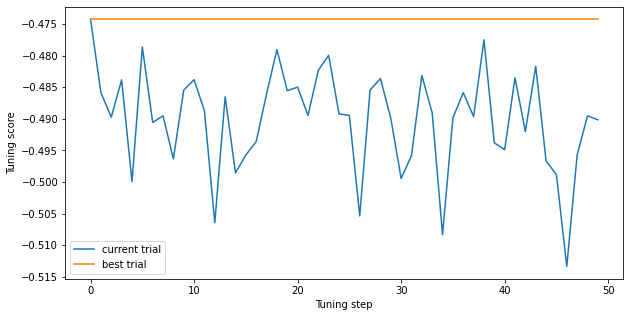

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(tuning_logs["score"], label="current trial")
plt.plot(tuning_logs["score"].cummax(), label="best trial")
plt.xlabel("Tuning step")
plt.ylabel("Tuning score")
plt.legend()
plt.show()